In [1]:
import numpy as np
import pandas as pd
from IPython.display import display , HTML
import plotly.graph_objects as go
import plotly.express as px
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df  = pd.read_csv('/kaggle/input/playground-series-s5e1/train.csv')

In [3]:
df.set_index('id', inplace=True)

In [4]:
df

,date,country,store,product,num_sold
id,,,,,
0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0
2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0
3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0
4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0
...,...,...,...,...,...
230125,2016-12-31,Singapore,Premium Sticker Mart,Holographic Goose,466.0
230126,2016-12-31,Singapore,Premium Sticker Mart,Kaggle,2907.0
230127,2016-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers,2299.0


In [5]:
df['country'].value_counts()

country
Canada       38355
Finland      38355
Italy        38355
Kenya        38355
Norway       38355
Singapore    38355
Name: count, dtype: int64

In [6]:
df['store'].value_counts()

store
Discount Stickers       76710
Stickers for Less       76710
Premium Sticker Mart    76710
Name: count, dtype: int64

In [7]:
df['product'].value_counts()

product
Holographic Goose     46026
Kaggle                46026
Kaggle Tiers          46026
Kerneler              46026
Kerneler Dark Mode    46026
Name: count, dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 230130 entries, 0 to 230129
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   date      230130 non-null  object 
 1   country   230130 non-null  object 
 2   store     230130 non-null  object 
 3   product   230130 non-null  object 
 4   num_sold  221259 non-null  float64
dtypes: float64(1), object(4)
memory usage: 10.5+ MB


In [9]:
numerical_features = df.select_dtypes(include = [np.number])
numerical_features.describe().T

,count,mean,std,min,25%,50%,75%,max
num_sold,221259.0,752.527382,690.165445,5.0,219.0,605.0,1114.0,5939.0


In [10]:
categorical_features = df.select_dtypes(include = [object])
categorical_features.describe().T

,count,unique,top,freq
date,230130,2557,2016-12-31,90
country,230130,6,Canada,38355
store,230130,3,Discount Stickers,76710
product,230130,5,Holographic Goose,46026


In [11]:
null_values = df.isnull().sum()
null_values

date           0
country        0
store          0
product        0
num_sold    8871
dtype: int64

In [12]:
missing_percentage = df.isnull().sum() / len(df) *100
missing_percentage

date        0.000000
country     0.000000
store       0.000000
product     0.000000
num_sold    3.854778
dtype: float64

In [13]:
df = df.dropna(subset=['num_sold'])

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


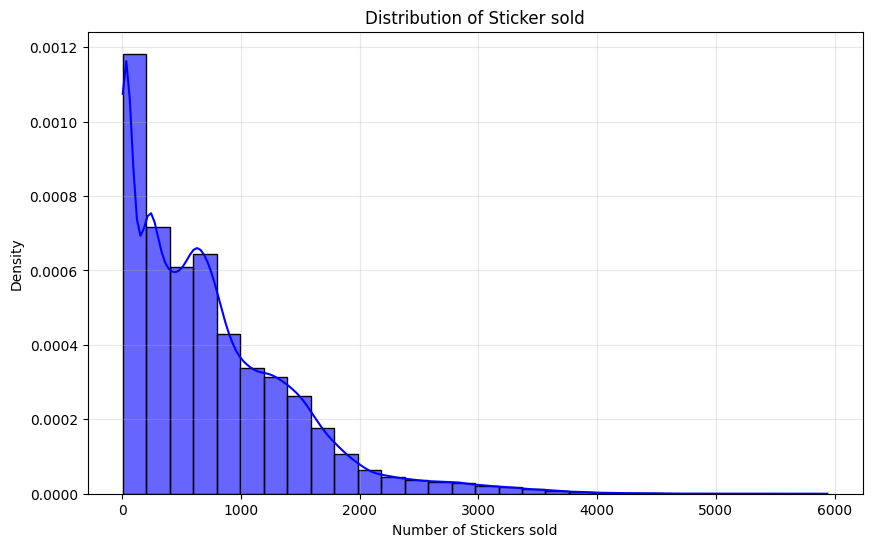

In [14]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='num_sold', stat='density', kde=True, 
            color='blue', alpha=0.6, bins=30 )
plt.title(f'Distribution of Sticker sold')
plt.xlabel('Number of Stickers sold')
plt.ylabel('Density')
plt.grid(True, alpha=0.3)
plt.show()

In [15]:
mu , sigma = stats.norm.fit(df['num_sold'])

hist_data = go.Histogram( x = df['num_sold'] , nbinsx = 50 , name = 'histogram' , opacity = 0.75 , histnorm = 'probability density' ,
                        marker = dict( color = 'purple'))

x_norm = np.linspace(df['num_sold'].min() ,  df['num_sold'].max() , 100)
y_norm = stats.norm.pdf(x_norm , mu , sigma)


norm_data = go.Scatter(x = x_norm  , y= y_norm , mode = 'lines' , name = f'Normal Distribution : ( mu : {mu : .2f} , sigma = {sigma : .2f})'  , line = dict(color = "green"))

fig = go.Figure(data = [hist_data  , norm_data])

fig.update_layout(
    title = "Number of Stickers sold Prediction" ,
    xaxis_title = "Number of Stickers sold" ,
    yaxis_title = "Density" ,
    plot_bgcolor = 'rgba(32 , 32 , 32 ,1)',
    paper_bgcolor = 'rgba(32 ,32 , 32 ,1)' ,
    font = dict(color = 'white')
)

In [17]:
qq_data = stats.probplot(df['num_sold'], dist="norm")

qq_fig = px.scatter(x=qq_data[0][0], y=qq_data[0][1], 
                   labels={'x': 'Theoretical Quantiles', 'y': 'Ordered Values'}, 
                   color_discrete_sequence=["purple"])

qq_fig.update_layout(
    title="Q-Q plot",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white')
)

slope, intercept, r_value, p_value, std_err = stats.linregress(qq_data[0][0], qq_data[0][1])
line_x = np.array(qq_data[0][0])
line_y = intercept + slope * line_x

line_data = go.Scatter(x=line_x, y=line_y, mode="lines", name="Normal Line", 
                      line=dict(color="green"))

qq_fig.add_trace(line_data)
qq_fig.show()

In [18]:
country_sell = df.groupby('country')['num_sold'].mean()

text_values = [f"{value:.0f}" for value in country_sell.values]

fig2 = px.bar( df , x =  country_sell.index , y = country_sell.values  , color =  country_sell.index  , text = text_values  ) 
fig2.update_layout( uniformtext_minsize = 10 , uniformtext_mode = 'hide' ,
                    title = "Number of Stickers sold by country" ,
                    xaxis_title = "Country" ,
                    yaxis_title = "average stickers sold" ,
                  ) 
fig2.show()

In [19]:
store_sell = df.groupby('store')['num_sold'].mean()

text_values1 = [f"{value:.0f}" for value in store_sell.values]

fig2 = px.bar(df ,  x =  store_sell.index , y =  store_sell.values , color = store_sell.index , text =  text_values1 ) 
fig2.update_layout( uniformtext_minsize = 10 , uniformtext_mode = 'hide' ,
                    title = 'Average Strickers sold by store' ,
                    xaxis_title = "store" ,
                    yaxis_title = "average stickers sold" ,
                  ) 
fig2.show()

In [20]:
product_sell = df.groupby('product')['num_sold'].mean()

text_values2 = [f"{value:.0f}" for value in product_sell.values]

fig2 = px.bar( df , x =  product_sell.index , y =  product_sell.values , color = product_sell.index , text =  text_values2 ) 
fig2.update_layout( uniformtext_minsize = 10 , uniformtext_mode = 'hide' ,
                    title = 'Average Strickers sold by product' ,
                    xaxis_title = "product" ,
                    yaxis_title = "average stickers sold" ,
                  ) 
fig2.show()

In [21]:
df_dates = df.copy()

df_dates['date'] = pd.to_datetime(df_dates['date'], format='%Y-%m-%d')


print("New date type:", df_dates['date'].dtype)

df_dates['year'] = df_dates['date'].dt.year
df_dates['month'] = df_dates['date'].dt.month
df_dates['day'] = df_dates['date'].dt.day
df_dates['day_of_week'] = df_dates['date'].dt.dayofweek
df_dates['quarter'] = df_dates['date'].dt.quarter
df_dates['is_weekend'] = df_dates['date'].dt.dayofweek >= 5


df_dates['month_sin'] = np.sin(2 * np.pi * df_dates['month']/12)
df_dates['month_cos'] = np.cos(2 * np.pi * df_dates['month']/12)
df_dates['dow_sin'] = np.sin(2 * np.pi * df_dates['day_of_week']/7)
df_dates['dow_cos'] = np.cos(2 * np.pi * df_dates['day_of_week']/7)


print("\nFirst few rows of transformed data:")
print(df_dates[['date', 'year', 'month', 'day', 'day_of_week', 'quarter', 'is_weekend']].head())

New date type: datetime64[ns]

First few rows of transformed data:
         date  year  month  day  day_of_week  quarter  is_weekend
id                                                               
1  2010-01-01  2010      1    1            4        1       False
2  2010-01-01  2010      1    1            4        1       False
3  2010-01-01  2010      1    1            4        1       False
4  2010-01-01  2010      1    1            4        1       False
5  2010-01-01  2010      1    1            4        1       False


In [22]:
df_dates

,date,country,store,product,num_sold,year,month,day,day_of_week,quarter,is_weekend,month_sin,month_cos,dow_sin,dow_cos
id,,,,,,,,,,,,,,,
1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
3,2010-01-01,Canada,Discount Stickers,Kerneler,423.0,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.0,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
5,2010-01-01,Canada,Stickers for Less,Holographic Goose,300.0,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230125,2016-12-31,Singapore,Premium Sticker Mart,Holographic Goose,466.0,2016,12,31,5,4,True,-2.449294e-16,1.000000,-0.974928,-0.222521
230126,2016-12-31,Singapore,Premium Sticker Mart,Kaggle,2907.0,2016,12,31,5,4,True,-2.449294e-16,1.000000,-0.974928,-0.222521
230127,2016-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers,2299.0,2016,12,31,5,4,True,-2.449294e-16,1.000000,-0.974928,-0.222521


In [23]:
df_dates = df_dates.drop(['date'], axis=1)

In [24]:
df_dates.info()

<class 'pandas.core.frame.DataFrame'>
Index: 221259 entries, 1 to 230129
Data columns (total 14 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      221259 non-null  object 
 1   store        221259 non-null  object 
 2   product      221259 non-null  object 
 3   num_sold     221259 non-null  float64
 4   year         221259 non-null  int32  
 5   month        221259 non-null  int32  
 6   day          221259 non-null  int32  
 7   day_of_week  221259 non-null  int32  
 8   quarter      221259 non-null  int32  
 9   is_weekend   221259 non-null  bool   
 10  month_sin    221259 non-null  float64
 11  month_cos    221259 non-null  float64
 12  dow_sin      221259 non-null  float64
 13  dow_cos      221259 non-null  float64
dtypes: bool(1), float64(5), int32(5), object(3)
memory usage: 19.6+ MB


In [25]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler , OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import make_scorer

In [26]:
categorical_transformer = Pipeline(steps = [
                 ('imputer' , SimpleImputer(strategy = 'constant' , fill_value = 'missing') ) ,
                ( 'onehot' , OneHotEncoder(handle_unknown = 'ignore' , sparse = False))
    
])

In [27]:
categorical_columns = df_dates.select_dtypes(include = ['object' , 'category'] ).columns

In [28]:
preprocessor = ColumnTransformer(
    transformers = [
        ('cat' , categorical_transformer , categorical_columns) 
      ], remainder = 'passthrough'
)

In [32]:
pipeline = Pipeline( steps = [
    ('preprocessor' ,  preprocessor ) 
])

In [33]:
X = df_dates.drop('num_sold' , axis =1 )
Y = df_dates['num_sold']

In [34]:
X

,country,store,product,year,month,day,day_of_week,quarter,is_weekend,month_sin,month_cos,dow_sin,dow_cos
id,,,,,,,,,,,,,
1,Canada,Discount Stickers,Kaggle,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
2,Canada,Discount Stickers,Kaggle Tiers,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
3,Canada,Discount Stickers,Kerneler,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
4,Canada,Discount Stickers,Kerneler Dark Mode,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
5,Canada,Stickers for Less,Holographic Goose,2010,1,1,4,1,False,5.000000e-01,0.866025,-0.433884,-0.900969
...,...,...,...,...,...,...,...,...,...,...,...,...,...
230125,Singapore,Premium Sticker Mart,Holographic Goose,2016,12,31,5,4,True,-2.449294e-16,1.000000,-0.974928,-0.222521
230126,Singapore,Premium Sticker Mart,Kaggle,2016,12,31,5,4,True,-2.449294e-16,1.000000,-0.974928,-0.222521
230127,Singapore,Premium Sticker Mart,Kaggle Tiers,2016,12,31,5,4,True,-2.449294e-16,1.000000,-0.974928,-0.222521


In [35]:
X_processed = pipeline.fit_transform(X)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



In [36]:
from xgboost import XGBRegressor

In [48]:
model = XGBRegressor(
    tree_method='gpu_hist',  
    predictor='gpu_predictor'
)

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X_processed , Y, test_size=0.15, random_state=42)

In [50]:
param_grid = {
    'regressor__tree_method': ['gpu_hist'],
    'regressor__predictor': ['gpu_predictor'],
    'regressor__n_estimators': [100, 200, 300],
    'regressor__max_depth': [3, 4, 5, 6],
    'regressor__learning_rate': [0.01, 0.1, 0.3],
    'regressor__subsample': [0.8, 0.9, 1.0],
    'regressor__colsample_bytree': [0.8, 0.9, 1.0],
    'regressor__min_child_weight': [1, 3, 5]
}

In [51]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 10

custom_mape_scorer = make_scorer(mape, greater_is_better=False)

In [52]:
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    cv=5,
    scoring= custom_mape_scorer,
    n_jobs=-1,
    verbose=1
)

In [53]:
import torch
print("Is GPU available:", torch.cuda.is_available())
print("GPU Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

Is GPU available: True
GPU Device Name: Tesla T4


In [54]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 972 candidates, totalling 4860 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[19:01:31] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[19:01:31] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "predictor", "regressor__colsample_bytree", "regressor__learning_rate", "regressor__max_depth", "regressor__min_child_weight", "regressor__n_estimators", "regressor__predictor", "regressor__subsample", "regressor__tree_method" } are not used.




GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
             param_grid={'regressor__colsample_bytree': [0.8, 0.9, 1.0],
                         'regressor__learning_rate': [0.01, 0.1, 0.3],
                         'regressor__max_depth': [3, 4, 5, 6],
                         'regressor__min_child_weight': [1, 3, 5],
                         'regressor__n_estimators': [100, 200, 300],
                         'regressor__predictor': ['gpu_predictor'],
                         'regressor__subsample': [0.8, 0.9, 1.0],
                         'regressor__tree_method': ['gpu_hist']},
             scoring=make_scorer(mape, greater_is_better=False), verbose=1)

In [55]:
print("Best parameters:", grid_search.best_params_)
print("Best MAPE:", -grid_search.best_score_)

Best parameters: {'regressor__colsample_bytree': 0.8, 'regressor__learning_rate': 0.01, 'regressor__max_depth': 3, 'regressor__min_child_weight': 1, 'regressor__n_estimators': 100, 'regressor__predictor': 'gpu_predictor', 'regressor__subsample': 0.8, 'regressor__tree_method': 'gpu_hist'}
Best MAPE: 1.736962736233


In [56]:
best_model = grid_search.best_estimator_

In [57]:
y_pred = best_model.predict(X_test)
test_mape = mape(y_test, y_pred)
print(f"Test set MAPE: {test_mape:.2f}%")

Test set MAPE: 1.71%


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[19:02:41] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[19:02:41] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.




In [95]:
test = pd.read_csv('/kaggle/input/playground-series-s5e1/test.csv')

In [96]:
test

,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
3,230133,2017-01-01,Canada,Discount Stickers,Kerneler
4,230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode
...,...,...,...,...,...
98545,328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose
98546,328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle
98547,328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers
98548,328678,2019-12-31,Singapore,Premium Sticker Mart,Kerneler


In [97]:
test_update = test.set_index('id')

In [98]:
test_update

,date,country,store,product
id,,,,
230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
230131,2017-01-01,Canada,Discount Stickers,Kaggle
230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers
230133,2017-01-01,Canada,Discount Stickers,Kerneler
230134,2017-01-01,Canada,Discount Stickers,Kerneler Dark Mode
...,...,...,...,...
328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose
328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle
328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers


In [100]:
# First, create a copy of the test data
test_dates = test_update.copy()

# Convert dates to datetime using the correct format
test_dates['date'] = pd.to_datetime(test_dates['date'], format='%Y-%m-%d')

# Extract date features 
test_dates['year'] = test_dates['date'].dt.year
test_dates['month'] = test_dates['date'].dt.month
test_dates['day'] = test_dates['date'].dt.day
test_dates['day_of_week'] = test_dates['date'].dt.dayofweek
test_dates['quarter'] = test_dates['date'].dt.quarter
test_dates['is_weekend'] = test_dates['date'].dt.dayofweek >= 5

# Create cyclical features
test_dates['month_sin'] = np.sin(2 * np.pi * test_dates['month']/12)
test_dates['month_cos'] = np.cos(2 * np.pi * test_dates['month']/12)
test_dates['dow_sin'] = np.sin(2 * np.pi * test_dates['day_of_week']/7)
test_dates['dow_cos'] = np.cos(2 * np.pi * test_dates['day_of_week']/7)

# Drop the original date column as we've extracted all features
test_dates = test_dates.drop(['date'], axis=1)

# Show first few rows to verify
print("\nFirst few rows of transformed test data:")
print(test_dates.head())


First few rows of transformed test data:
       country              store             product  year  month  day  \
id                                                                        
230130  Canada  Discount Stickers   Holographic Goose  2017      1    1   
230131  Canada  Discount Stickers              Kaggle  2017      1    1   
230132  Canada  Discount Stickers        Kaggle Tiers  2017      1    1   
230133  Canada  Discount Stickers            Kerneler  2017      1    1   
230134  Canada  Discount Stickers  Kerneler Dark Mode  2017      1    1   

        day_of_week  quarter  is_weekend  month_sin  month_cos   dow_sin  \
id                                                                         
230130            6        1        True        0.5   0.866025 -0.781831   
230131            6        1        True        0.5   0.866025 -0.781831   
230132            6        1        True        0.5   0.866025 -0.781831   
230133            6        1        True        0.5 

In [101]:
categorical_columns_test = df_dates.select_dtypes(include = ['object' , 'category'] ).columns

In [102]:
preprocessor_test = ColumnTransformer(
    transformers = [
        ('cat' , categorical_transformer , categorical_columns_test) 
      ], remainder = 'passthrough'
)

In [103]:
pipeline_test = Pipeline( steps = [
    ('preprocessor' ,  preprocessor_test ) 
])

In [104]:
X_sub = test_dates

In [105]:
X_sub_pro = pipeline.fit_transform(X_sub)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



In [106]:
X_sub_pro[0]

array([1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0,
       0.0, 2017, 1, 1, 6, 1, True, 0.49999999999999994,
       0.8660254037844387, -0.7818314824680299, 0.6234898018587334],
      dtype=object)

In [107]:
y_sub = best_model.predict(X_sub_pro)

In [108]:
submission = pd.DataFrame({
    'id': test['id'], 
    'num_sold': y_sub
})

In [109]:
submission.to_csv('submission.csv', index=False)